# 함수 정의
## yolo 모델을 통해서 학습한 학습데이터를 사진으로 보여주는 함수 정의합니다.

패러미터로 학습한 모델의 출력 숫자를 넘겨주면 됩니다.

## 추가로 모든 파일의 확장자를 jpg로 바꾸는 함수도 정의 했습니다.

In [1]:
from google.colab import drive
import os

drive.mount('/content/drive')

Mounted at /content/drive


In [2]:
def output_data_show(test_exp_num):
    
    import os
    import glob
    from IPython.display import Image , display

    number = test_exp_num

    if not os.path.exists('/content/drive/MyDrive/dmz_teamproject/yolov5/runs/detect/exp' + str(number) + '/'):
        raise Exception('test_exp_num 을 다시 확인하세요.')
    
    for imageName in glob.glob('/content/drive/MyDrive/dmz_teamproject/yolov5/runs/detect/exp' + str(number) +'/*jpg'):
        display(Image(filename = imageName))
        print("\n")

In [3]:
def file2jpg(dir_path):
    import os
    import shutil

    dir_path = dir_path

    for file_name in os.listdir(dir_path):

        file_path = os.path.join(dir_path, file_name)
        
        if file_path.endswith(('.jpg', '.jpeg', '.png')):
            
            new_file_name = os.path.splitext(file_name)[0] + '.jpg'
            new_file_path = os.path.join(dir_path, new_file_name)
            
            shutil.move(file_path, new_file_path)
            
    print("Done!")

## YOLOv5 레퍼지토리 다운로드

In [ ]:
# 처음에 한번만 실행 !
!git clone https://github.com/ultralytics/yolov5  # YOLOv5 레퍼지토리 clone

fatal: destination path 'yolov5' already exists and is not an empty directory.


In [4]:
%cd '/content/drive/MyDrive/dmz_teamproject/'

/content/drive/MyDrive/dmz_teamproject


In [5]:
# 필요한 패키지 다운로드 및 임포트
%cd yolov5
%pip install -qr requirements.txt # install dependencies
%pip install -q roboflow

import torch
import yaml
from IPython.display import Image, clear_output  # to display images

print(f"Setup complete. Using torch {torch.__version__} ({torch.cuda.get_device_properties(0).name if torch.cuda.is_available() else 'CPU'})")

/content/drive/MyDrive/dmz_teamproject/yolov5
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 184.3/184.3 kB 4.6 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 62.7/62.7 kB 6.2 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 56.3/56.3 kB 2.6 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 58.8/58.8 kB 7.4 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 67.8/67.8 kB 9.3 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 54.5/54.5 kB 6.7 MB/s eta 0:00:00
Setup complete. Using torch 2.0.0+cu118 (Tesla T4)


## 데이터셋 다운로드, yaml 파일 수정


In [6]:
data_dir = '/content/drive/MyDrive/dmz_teamproject/dataset/detection_data.v4i.yolov5pytorch'
data_yaml = '/content/drive/MyDrive/dmz_teamproject/dataset/detection_data.v4i.yolov5pytorch/data.yaml'

In [7]:
with open(data_yaml) as f:
    film = yaml.load(f, Loader=yaml.FullLoader)
    display(film)

{'names': ['dress',
  'jacket',
  'jean',
  'pants',
  'polar',
  'shirt',
  'short',
  'skirt'],
 'nc': 8,
 'train': '/content/drive/MyDrive/dmz_teamproject/dataset/detection_data.v4i.yolov5pytorch/train/images',
 'val': '/content/drive/MyDrive/dmz_teamproject/dataset/detection_data.v4i.yolov5pytorch/test/images'}

In [8]:
film['train'] = '/content/drive/MyDrive/dmz_teamproject/dataset/detection_data.v4i.yolov5pytorch/train/images'
film['val'] = '/content/drive/MyDrive/dmz_teamproject/dataset/detection_data.v4i.yolov5pytorch/test/images'

with open(data_yaml, 'w') as f:
    yaml.dump(film, f)

print('변경된 yaml 파일 :')
with open(data_yaml) as f:
    film = yaml.load(f, Loader=yaml.FullLoader)
    display(film)

변경된 yaml 파일 :


{'names': ['dress',
  'jacket',
  'jean',
  'pants',
  'polar',
  'shirt',
  'short',
  'skirt'],
 'nc': 8,
 'train': '/content/drive/MyDrive/dmz_teamproject/dataset/detection_data.v4i.yolov5pytorch/train/images',
 'val': '/content/drive/MyDrive/dmz_teamproject/dataset/detection_data.v4i.yolov5pytorch/test/images'}

## 모델 학습

In [9]:
!python train.py --img 400 --batch 16 --epochs 250  --data {data_yaml} --weights yolov5s.pt --cache

train: weights=yolov5s.pt, cfg=, data=/content/drive/MyDrive/dmz_teamproject/dataset/detection_data.v4i.yolov5pytorch/data.yaml, hyp=data/hyps/hyp.scratch-low.yaml, epochs=250, batch_size=16, imgsz=400, rect=False, resume=False, nosave=False, noval=False, noautoanchor=False, noplots=False, evolve=None, bucket=, cache=ram, image_weights=False, device=, multi_scale=False, single_cls=False, optimizer=SGD, sync_bn=False, workers=8, project=runs/train, name=exp, exist_ok=False, quad=False, cos_lr=False, label_smoothing=0.0, patience=100, freeze=[0], save_period=-1, seed=0, local_rank=-1, entity=None, upload_dataset=False, bbox_interval=-1, artifact_alias=latest
Command 'git fetch origin' timed out after 5 seconds
requirements: /content/drive/MyDrive/dmz_teamproject/requirements.txt not found, check failed.
YOLOv5 🚀 v7.0-147-gaa7c45c Python-3.10.11 torch-2.0.0+cu118 CUDA:0 (Tesla T4, 15102MiB)

hyperparameters: lr0=0.01, lrf=0.01, momentum=0.937, weight_decay=0.0005, warmup_epochs=3.0, warmu

# 텐서보드 

In [10]:
# Start tensorboard
# Launch after you have started training
# logs save in the folder "runs"
%load_ext tensorboard
%tensorboard --logdir runs

Output hidden; open in https://colab.research.google.com to view.

# 학습한 모델 테스트

In [11]:
# 테스트 이미지 경로
test_data_dir = film['val']

# 실험 번호 지정 - 진행한 실험이 저장된 경로 확인해서 기입! - runs/train/exp1 인지 exp2, exp3 인지 확인 후 아래 번호 지정
train_exp_num = 14

In [12]:
!python detect.py --weights runs/train/exp{train_exp_num}/weights/best.pt --img 416 --conf 0.1 --source {test_data_dir}

detect: weights=['runs/train/exp14/weights/best.pt'], source=/content/drive/MyDrive/dmz_teamproject/dataset/detection_data.v4i.yolov5pytorch/test/images, data=data/coco128.yaml, imgsz=[416, 416], conf_thres=0.1, iou_thres=0.45, max_det=1000, device=, view_img=False, save_txt=False, save_conf=False, save_crop=False, nosave=False, classes=None, agnostic_nms=False, augment=False, visualize=False, update=False, project=runs/detect, name=exp, exist_ok=False, line_thickness=3, hide_labels=False, hide_conf=False, half=False, dnn=False, vid_stride=1
requirements: /content/drive/MyDrive/dmz_teamproject/requirements.txt not found, check failed.
YOLOv5 🚀 v7.0-147-gaa7c45c Python-3.10.11 torch-2.0.0+cu118 CUDA:0 (Tesla T4, 15102MiB)

Fusing layers... 
Model summary: 157 layers, 7031701 parameters, 0 gradients, 15.8 GFLOPs
image 1/8 /content/drive/MyDrive/dmz_teamproject/dataset/detection_data.v4i.yolov5pytorch/test/images/img_0131_jpeg.rf.76b9fa34124f088fd6cc76a6b24298ac.jpg: 416x416 1 dress, 7.4m

In [14]:
test_exp_num = 14

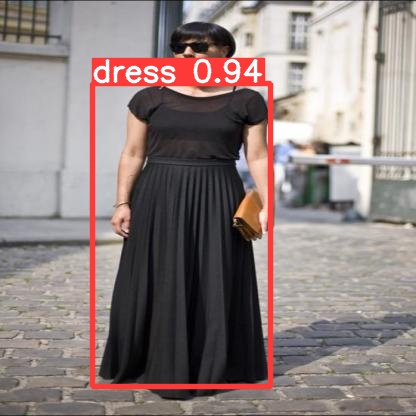

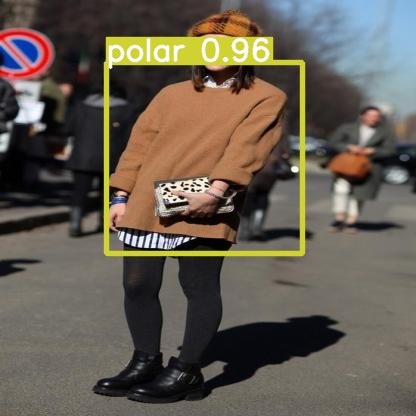

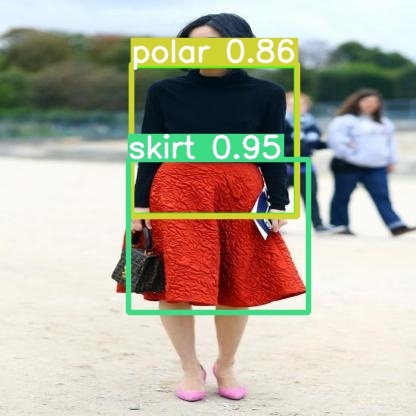

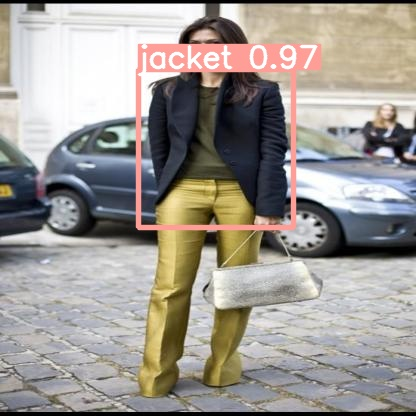

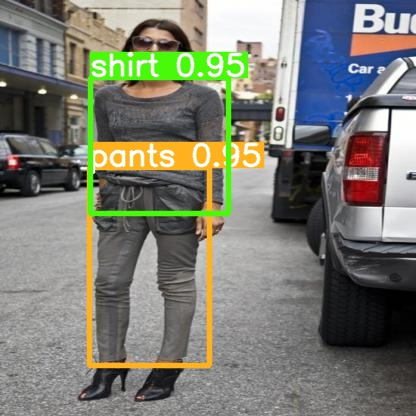

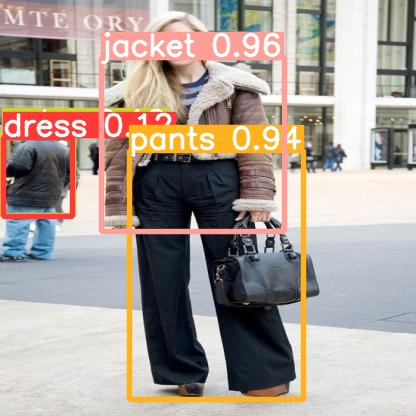

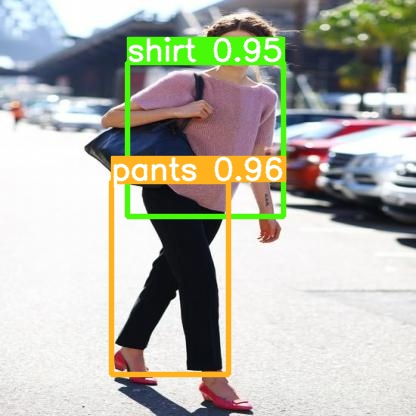

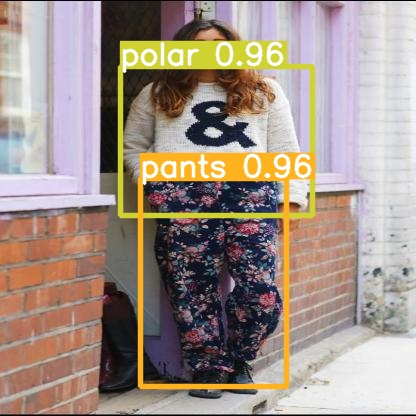

In [15]:
output_data_show(test_exp_num)

# 외부 데이터를 통한 성능 평가

In [16]:
out_data_dir = "/content/drive/MyDrive/dmz_teamproject/test_dataset/out_data/picture"

In [17]:
!python detect.py --weights runs/train/exp{train_exp_num}/weights/best.pt --img 416 --conf 0.1 --source {out_data_dir}

detect: weights=['runs/train/exp14/weights/best.pt'], source=/content/drive/MyDrive/dmz_teamproject/test_dataset/out_data/picture, data=data/coco128.yaml, imgsz=[416, 416], conf_thres=0.1, iou_thres=0.45, max_det=1000, device=, view_img=False, save_txt=False, save_conf=False, save_crop=False, nosave=False, classes=None, agnostic_nms=False, augment=False, visualize=False, update=False, project=runs/detect, name=exp, exist_ok=False, line_thickness=3, hide_labels=False, hide_conf=False, half=False, dnn=False, vid_stride=1
requirements: /content/drive/MyDrive/dmz_teamproject/requirements.txt not found, check failed.
YOLOv5 🚀 v7.0-147-gaa7c45c Python-3.10.11 torch-2.0.0+cu118 CUDA:0 (Tesla T4, 15102MiB)

Fusing layers... 
Model summary: 157 layers, 7031701 parameters, 0 gradients, 15.8 GFLOPs
image 1/11 /content/drive/MyDrive/dmz_teamproject/test_dataset/out_data/picture/0.jpg: 416x416 (no detections), 7.5ms
image 2/11 /content/drive/MyDrive/dmz_teamproject/test_dataset/out_data/picture/1.j

In [18]:
file2jpg(out_data_dir)

Done!


In [19]:
output_data_show(15)

Output hidden; open in https://colab.research.google.com to view.

# 저장용

In [20]:
# 학습한 베스트 모델 저장
from google.colab import files
files.download('./runs/train/exp' + str(14) + '/weights/best.pt')

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>